In [3]:
import geopandas as gpd
import rioxarray as rxr
import xarray as xr         #for reshaping purpose
import pandas as pd
import pytz
import rasterio
import os
import datetime
import numpy as np
import matplotlib.pyplot as plt

from shapely.geometry import Point


os.chdir('/Users/gaurav/UAH/temperature_modelling/')

#Custom modules
from lib import helper

%load_ext autoreload
%autoreload 2

In [10]:
def filename_to_date(input):
    date_part = input.split('_')[3][3:]
    year = date_part[:4]
    time = date_part[-6:]
    day_of_year = date_part[4:-6]

    #convert day of year to date
    # date = datetime.datetime(int(year), 1, 1) + datetime.timedelta(int(day_of_year) - 1) + datetime.timedelta(hours=int(time[:2]), minutes=int(time[2:4]))
    date = datetime.datetime(int(year), 1, 1) + datetime.timedelta(int(day_of_year) - 1) + datetime.timedelta(hours=int(time[:2]), minutes=0)
    date = pytz.utc.localize(date)
    #convert  utc to cdt

    # Convert to Central Daylight Time (CDT) --> For Madison
    #Las Vegas,Nevada (Pacific Daylight time, PDT) 
    # and Orlando, Florida (Eastern Daylight Time, EDT).
    cdt = pytz.timezone('America/Chicago')
    date_cdt = date.astimezone(cdt)

    # format = "%Y-%m-%d %H:%M:%S"

    # return str(date)
    return str(date_cdt)

def get_file_segments(raster_directory):
    ''' Gorups files by hours'''
    filenames = []
    times = []
    segments = dict()

    for x in os.listdir(raster_directory):
        if '.tif' in x:
            filenames.append(x)
            times.append(filename_to_date(str(x)))
    
    # for hour in time_dframe.hour.unique():
    #     segments[hour] = []

    time_dframe = pd.DataFrame({'filename':filenames,'time':times})
    time_dframe['time'] = pd.to_datetime(time_dframe['time'])
    time_dframe['hour'] = time_dframe['time'].dt.hour
    file_list = []
    for hour in time_dframe.hour.unique():
        df_ = time_dframe[time_dframe['hour']==hour]
        files = df_.filename.values

        segments[hour] = files

    
    return segments





### Step 1 : Module to convert all tiff files to same size and projection


In [50]:
raster_path_ = '/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/Madison/ECOSTRESS/geotiff_clipped_stateplane/'
# 
temperature_data_1 = helper.uniform_files(raster_path_)
df = helper.get_list_of_stations(temperature_data_1)


In [13]:
segments

{0: array(['ECO2LSTE.001_SDS_LST_doy2020207052254_aid0001_clipped_stateplane.tif',
        'ECO2LSTE.001_SDS_LST_doy2020193051349_aid0001_clipped_stateplane.tif',
        'ECO2LSTE.001_SDS_LST_doy2018257051114_aid0001_clipped_stateplane.tif'],
       dtype=object),
 2: array(['ECO2LSTE.001_SDS_LST_doy2021260073127_aid0001_clipped_stateplane.tif',
        'ECO2LSTE.001_SDS_LST_doy2021245075654_aid0001_clipped_stateplane.tif'],
       dtype=object),
 4: array(['ECO2LSTE.001_SDS_LST_doy2018259095525_aid0001_clipped_stateplane.tif'],
       dtype=object),
 5: array(['ECO2LSTE.001_SDS_LST_doy2020195100744_aid0001_clipped_stateplane.tif',
        'ECO2LSTE.001_SDS_LST_doy2019241103621_aid0001_clipped_stateplane.tif',
        'ECO2LSTE.001_SDS_LST_doy2021252103314_aid0001_clipped_stateplane.tif'],
       dtype=object),
 6: array(['ECO2LSTE.001_SDS_LST_doy2018255114638_aid0001_clipped_stateplane.tif',
        'ECO2LSTE.001_SDS_LST_doy2019192112942_aid0001_clipped_stateplane.tif'],
       dtype

In [12]:
#this part aggregates hourly files and save it to output directory

os.chdir('/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/Madison/ECOSTRESS/geotiff_clipped_stateplane/')
# Directory containing your raster files
raster_directory = '/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/Madison/ECOSTRESS/geotiff_clipped_stateplane/'
output_directory = '/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/Madison/ECOSTRESS/output_directory'
shapefile_path = '/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/Madison/shpfile/Madison_WI_UA_mer.shp'

input_path = os.listdir(raster_directory)[1]

#getting groups of files
segments = get_file_segments(raster_directory)
segments = dict(sorted(segments.items(), key=lambda x: x[0]))

boundary_gdf = gpd.read_file(shapefile_path)
target_crs = gpd.read_file(shapefile_path).crs



# for key in segments.keys():
#     # print(key)
#     value = segments[key]
#     path_name = sorted(value)
#     temperature_data = rxr.open_rasterio(path_name[0])

#     #Its summer data, 0 values were filled with 0
#     temperature_data.values[temperature_data.values==0] = np.nan
#     value_array = [temperature_data.values]

#     if len(path_name)>0:
#         for file in path_name[1:]:
#             temp_data = rxr.open_rasterio(file).values
#             temp_data[temp_data==0] = np.nan
#             value_array.append(temp_data)
            
#     temperature_data.values = np.nanmean(value_array,axis=0)
#     # temperature_data = temperature_data.rio.reproject(target_crs)

#     #saving the file to output directory        
#     temperature_data.rio.to_raster(f'{output_directory}/temperature_{str(key).zfill(2)}.tif')

# print(f'Saved all tiff files to {output_directory}')

In [54]:
path_name

['ECO2LSTE.001_SDS_LST_doy2022148033840_aid0001_clipped_stateplane.tif']

In [363]:
#Segment to fill missing hours
#output_directory  : comes from above

files = [x for x in sorted(os.listdir(output_directory)) if '.tif' in x]
hours = [int(x.split('_')[1].split('.')[0]) for x in files if 'interploated' not in x]


missing_hours = [x for x in range(0,24) if x not in hours]

#for now, filling missing hours with average of before and after hour

for hour in missing_hours:
    if hour == 0:
        before_hour = 23
        after_hour = 1
    elif hour == 23:
        before_hour = 22
        after_hour = 0

    else:
        before_hour = hour-1
        after_hour = hour+1
    
    before_hour_file = [x for x in files if str(before_hour).zfill(2) in x][0]
    after_hour_file = [x for x in files if str(after_hour).zfill(2) in x][0]

    before_hour_data = rxr.open_rasterio(os.path.join(output_directory,before_hour_file))
    after_hour_data = rxr.open_rasterio(os.path.join(output_directory,after_hour_file))

    missing_hour_data = np.nanmean([before_hour_data.values + after_hour_data.values],axis=0)
    before_hour_data.values = missing_hour_data

    before_hour_data.rio.to_raster(f'{output_directory}/interploated_temperature_{str(hour).zfill(2)}.tif')
    print(f'File created : interploated_temperature_{str(hour).zfill(2)}.tif')

File created : interploated_temperature_01.tif
File created : interploated_temperature_03.tif
File created : interploated_temperature_13.tif
File created : interploated_temperature_17.tif
File created : interploated_temperature_23.tif


/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_5231/4187264466.py:30: RuntimeWarning: Mean of empty slice
  missing_hour_data = np.nanmean([before_hour_data.values + after_hour_data.values],axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_5231/4187264466.py:30: RuntimeWarning: Mean of empty slice
  missing_hour_data = np.nanmean([before_hour_data.values + after_hour_data.values],axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_5231/4187264466.py:30: RuntimeWarning: Mean of empty slice
  missing_hour_data = np.nanmean([before_hour_data.values + after_hour_data.values],axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_5231/4187264466.py:30: RuntimeWarning: Mean of empty slice
  missing_hour_data = np.nanmean([before_hour_data.values + after_hour_data.values],axis=0)
/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_5231/4187264466.py:30: RuntimeWarning: Mean of empty slice
  missing_hour_data = np.nanmean([before_h

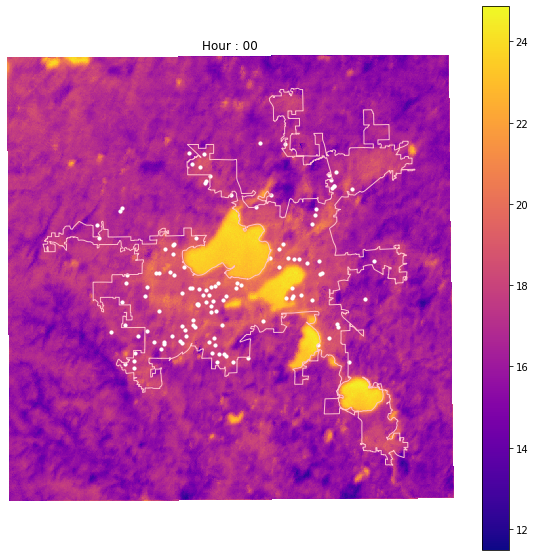

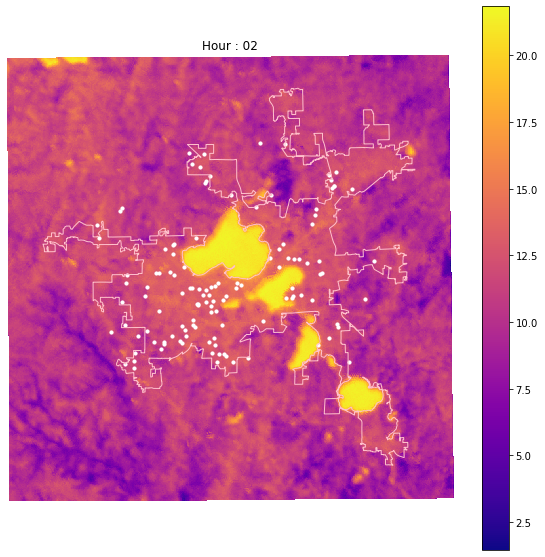

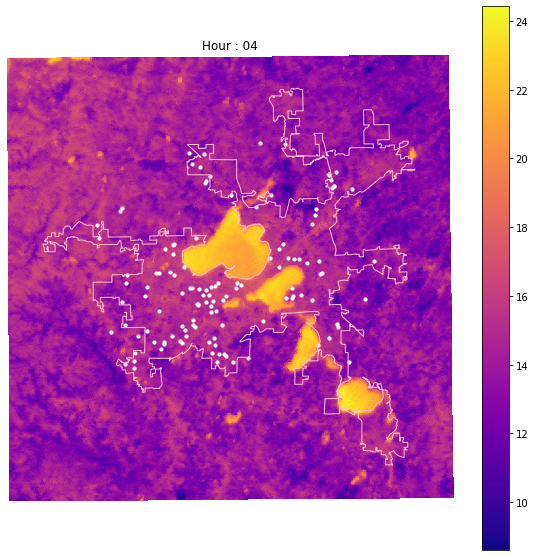

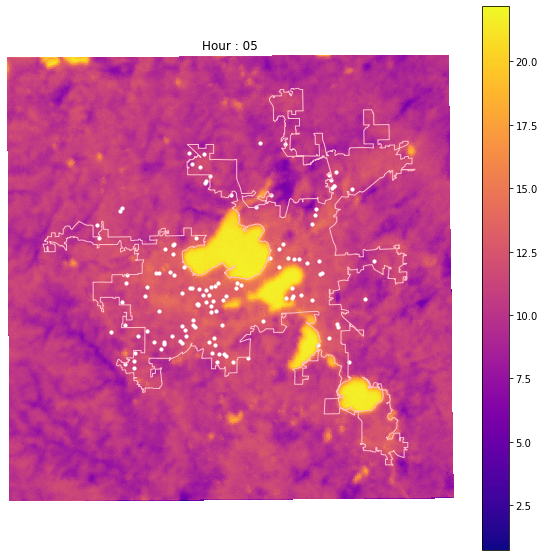

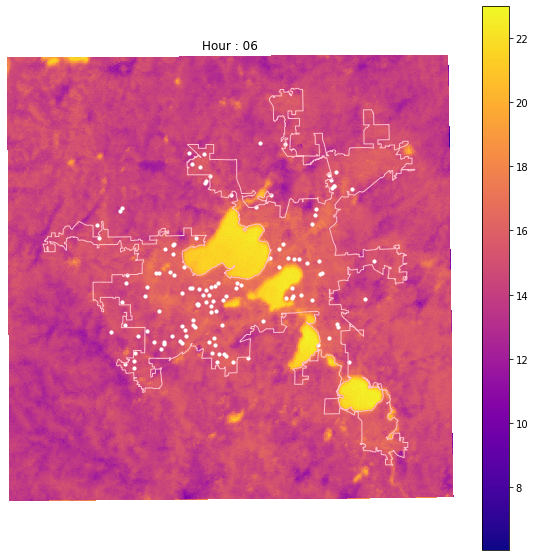

...

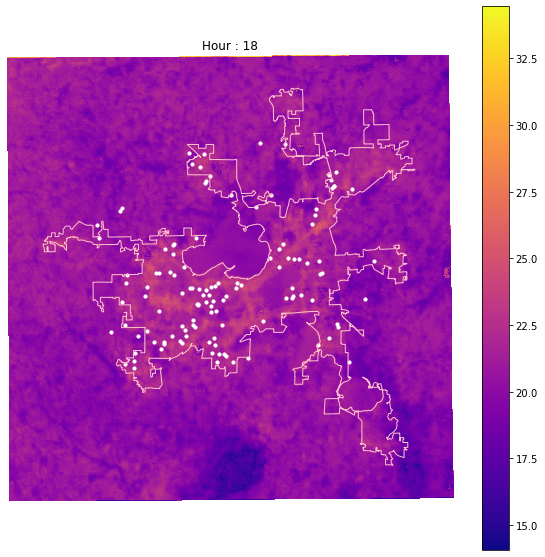

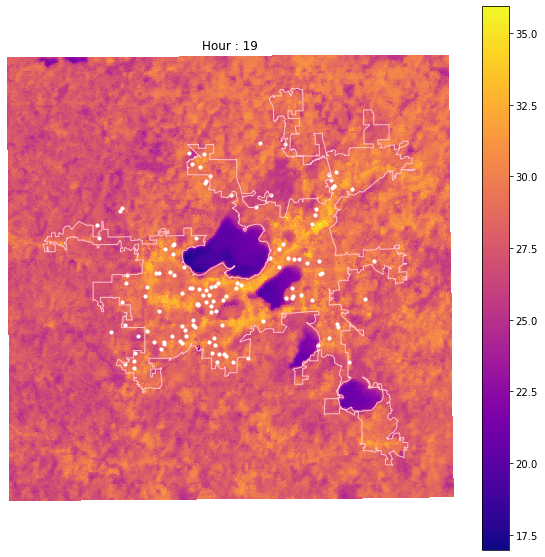

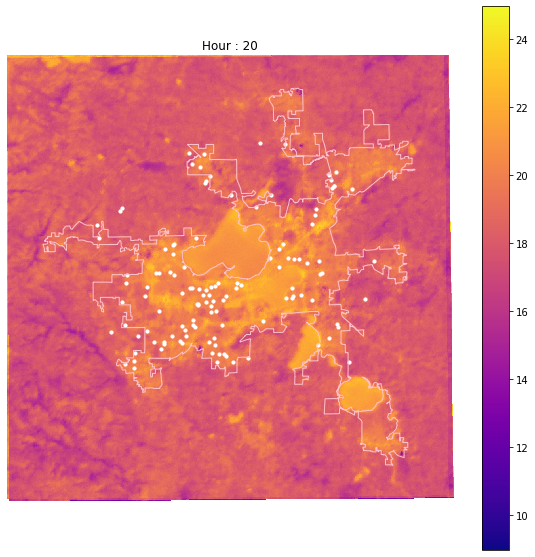

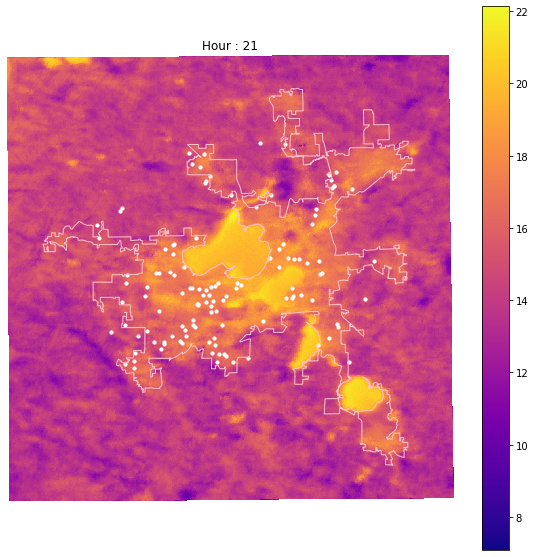

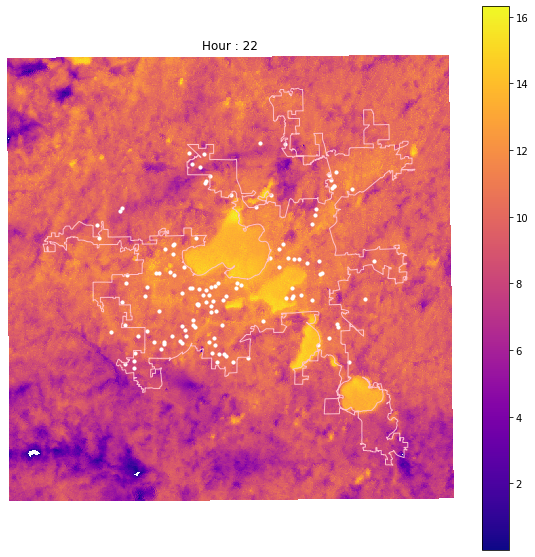

In [7]:
#Creating basic LST Plots

list_of_files = [x for x in sorted(os.listdir(output_directory)) if '.tif' in x]

scatter_data = pd.read_csv('/Users/gaurav/UAH/temperature_modelling/data/processed_data/Madison_2021/clean_Madison_pws_.csv')
scatter_data = scatter_data.groupby(['station','latitude','longitude']).mean().reset_index()[['station','latitude','longitude']]
scatter_data = gpd.GeoDataFrame(scatter_data)
scatter_data['latitude'] = scatter_data['latitude'].astype(float)
scatter_data['longitude'] = scatter_data['longitude'].astype(float)
scatter_data['geometry'] = [Point(xy) for xy in zip(scatter_data['longitude'], scatter_data['latitude'])]
scatter_gdf = gpd.GeoDataFrame(scatter_data,geometry=scatter_data['geometry'], crs="EPSG:4326")

# scatter_gdf = scatter_gdf.to_crs(boundary_gdf.crs)
temperature_data_crs = rxr.open_rasterio(os.path.join(output_directory,list_of_files[0])).rio.crs
scatter_gdf_convert = scatter_gdf.to_crs(temperature_data_crs)
boundary_gdf_convert = boundary_gdf.to_crs(temperature_data_crs)

for file in list_of_files:
    temp_ = rxr.open_rasterio(os.path.join(output_directory,file))
    plt.figure(figsize=(10,10))
    temp_.plot(cmap='plasma',)    
    # # # boundary_gdf.boundary.plot(ax=plt.gca(), edgecolor='blue', linewidth=1)
    boundary_gdf.to_crs(temperature_data_crs).boundary.plot(ax=plt.gca(), edgecolor='pink', linewidth=1)
    scatter_gdf_convert.plot(ax=plt.gca(), color='white', markersize=10)
    plt.axis('off')  # Hide axis

    if 'interploated' not in file:
        fname = str(file.split('_')[1].split('.')[0]).zfill(2)  #gives hour
        title = f'Hour : {fname}'
    else:
        fname = str(file.split('_')[2].split('.')[0]).zfill(2)
        title = f'Hour : {fname} (Interploated)'
    
    save_loc = f'/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/Madison_2021/hour_{fname}.png'
    
    
    plt.title(title)
    plt.savefig(save_loc, bbox_inches='tight', pad_inches=0, dpi=300,)



In [8]:
gif_directory = '/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/Madison_2021/'
helper.to_gif(gif_directory,'Madison',2021,image_fps=1.25)

In [55]:
updated_raster_directory = '/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/Madison/ECOSTRESS/output_directory/'
adjusted_lst_directory = '/Users/gaurav/UAH/ECOSTRESS_and_urban_surface_dataset/Madison/ECOSTRESS/adjusted_output_directory/'
adjusted_save_directory = '/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/Madison_2021_adjusted_lst/'

files = sorted([x for x in os.listdir(updated_raster_directory) if '.tif' in x])
files = [x for x in files if 'interploated' not in x]

for file in files:
    
    temp_ = rxr.open_rasterio(os.path.join(updated_raster_directory,file))
    # temp_.values = temp_.values - np.nanmean(temp_.values) + min(temp_.values)
    temp_.values = temp_.values - np.nanmean(temp_.values)
    temp_.rio.to_raster(f'{adjusted_lst_directory}/{file}')


In [56]:
## Interpolating missing hours for adjusted LST

#adjusted_lst_directory  : comes from above

files = [x for x in sorted(os.listdir(adjusted_lst_directory)) if '.tif' in x]
hours = [int(x.split('_')[1].split('.')[0]) for x in files if 'interploated' not in x]

missing_hours = [x for x in range(0,24) if x not in hours]

#for now, filling missing hours with average of before and after hour

for hour in missing_hours:
    if hour == 0:
        before_hour = 23
        after_hour = 1
    elif hour == 23:
        before_hour = 22
        after_hour = 0

    else:
        before_hour = hour-1
        after_hour = hour+1
    
    before_hour_file = [x for x in files if str(before_hour).zfill(2) in x][0]
    after_hour_file = [x for x in files if str(after_hour).zfill(2) in x][0]

    print(f'hour : {hour}, before_hour : {before_hour_file}, after_hour : {after_hour_file}')

    before_hour_data = rxr.open_rasterio(os.path.join(adjusted_lst_directory,before_hour_file))
    after_hour_data = rxr.open_rasterio(os.path.join(adjusted_lst_directory,after_hour_file))

    missing_hour_data = np.nanmean([before_hour_data.values,after_hour_data.values],axis=0)
    before_hour_data.values = missing_hour_data

    before_hour_data.rio.to_raster(f'{adjusted_lst_directory}/interpolated_temperature_{str(hour).zfill(2)}.tif')
    print(f'File created : interpolated_temperature_{str(hour).zfill(2)}.tif')

hour : 1, before_hour : temperature_00.tif, after_hour : temperature_02.tif
File created : interpolated_temperature_01.tif
hour : 3, before_hour : temperature_02.tif, after_hour : temperature_04.tif
File created : interpolated_temperature_03.tif
hour : 13, before_hour : temperature_12.tif, after_hour : temperature_14.tif
File created : interpolated_temperature_13.tif
hour : 17, before_hour : temperature_16.tif, after_hour : temperature_18.tif
File created : interpolated_temperature_17.tif
hour : 23, before_hour : temperature_22.tif, after_hour : temperature_00.tif
File created : interpolated_temperature_23.tif


/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_81510/1892435370.py:32: RuntimeWarning:

Mean of empty slice

/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_81510/1892435370.py:32: RuntimeWarning:

Mean of empty slice

/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_81510/1892435370.py:32: RuntimeWarning:

Mean of empty slice

/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_81510/1892435370.py:32: RuntimeWarning:

Mean of empty slice

/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_81510/1892435370.py:32: RuntimeWarning:

Mean of empty slice



/var/folders/qr/fds_zg7j76g51mq0zmqdqfnc0000gn/T/ipykernel_81510/1947488695.py:16: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



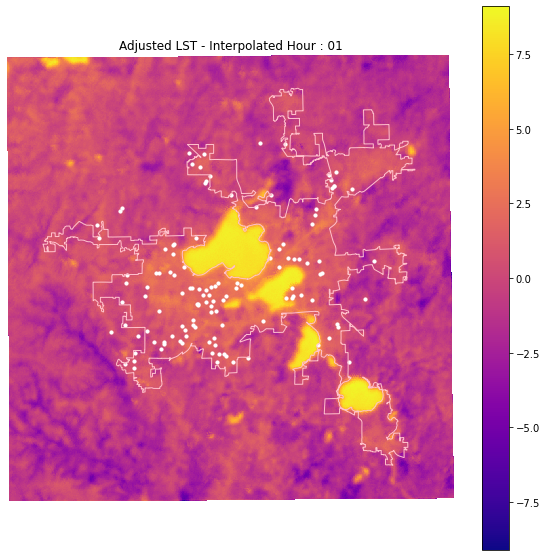

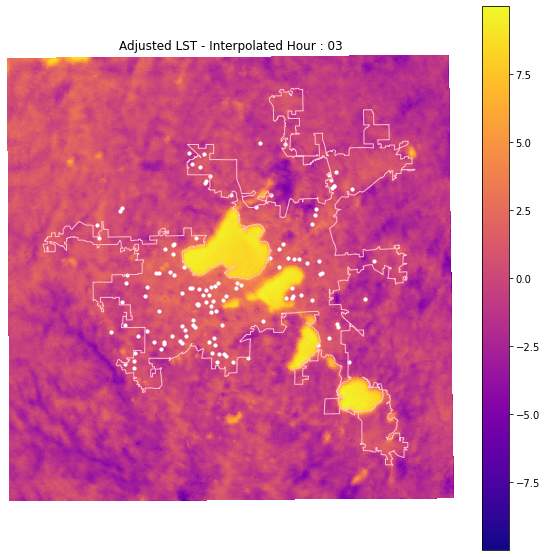

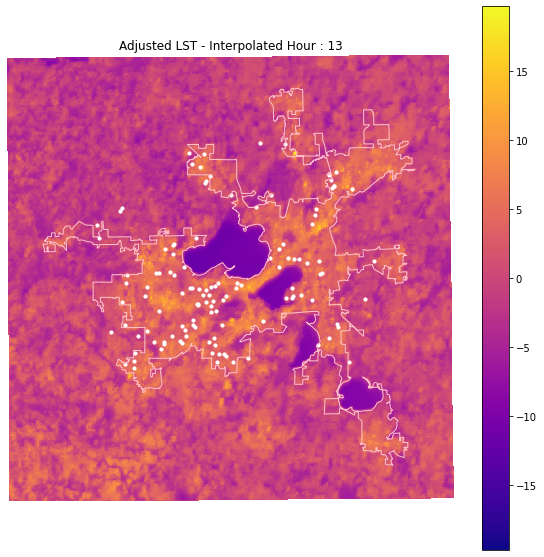

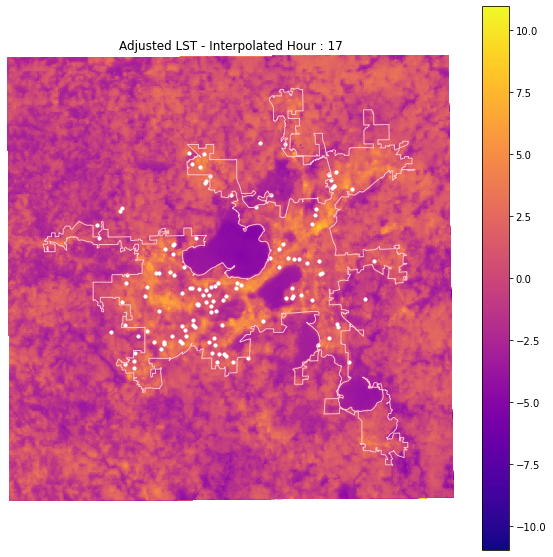

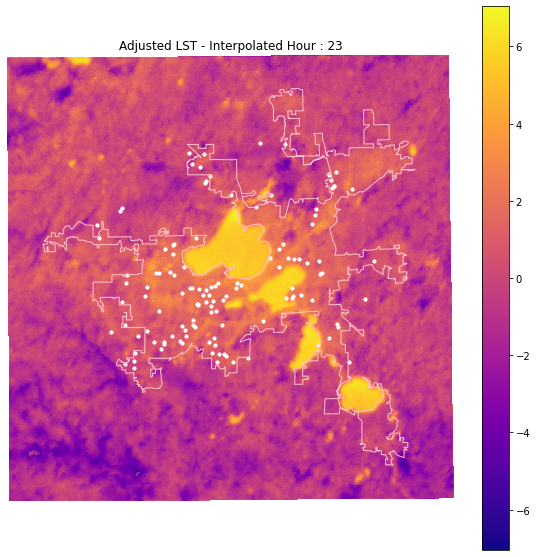

...

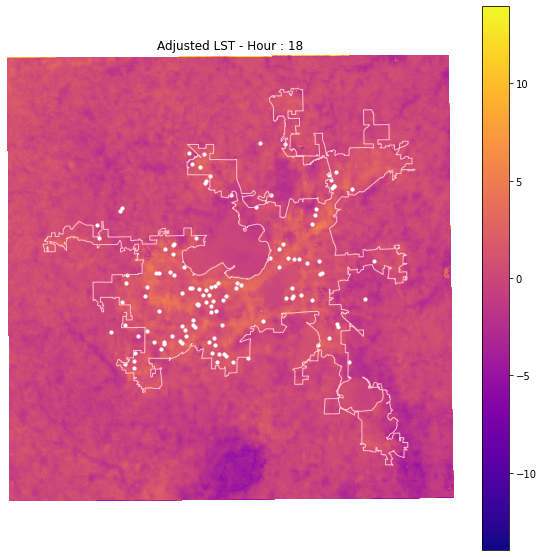

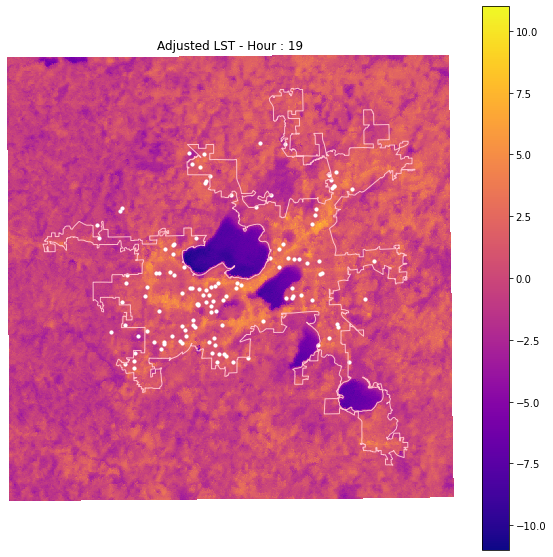

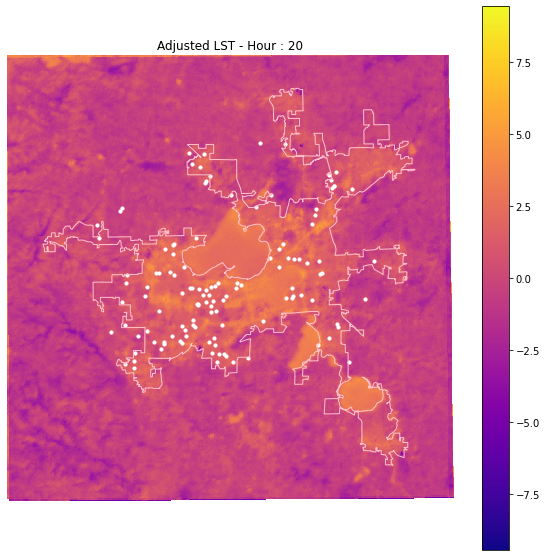

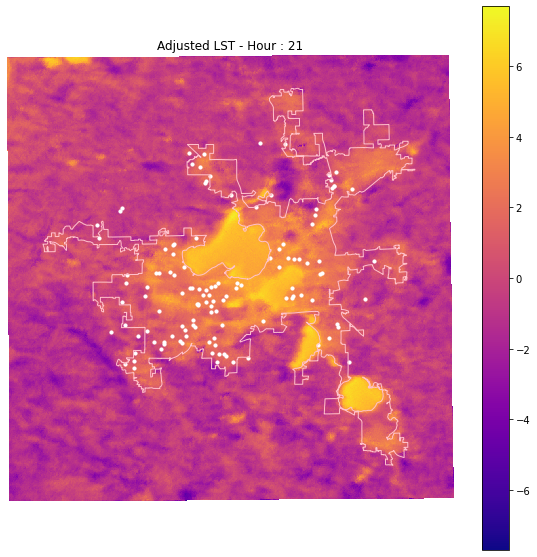

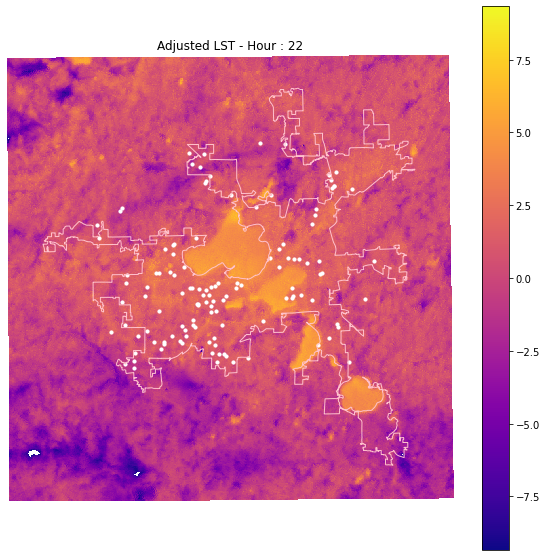

In [57]:
## Creating plots for adjusted LST

files = sorted([x for x in os.listdir(adjusted_lst_directory) if '.tif' in x])

for file in files:    
    temp_ = rxr.open_rasterio(os.path.join(adjusted_lst_directory,file))

    hour = file.split('.')[0][-2:]
    if 'interpolated' in file:
        title = f'Adjusted LST - Interpolated Hour : {hour}'
    else:
        title = f'Adjusted LST - Hour : {hour}'
    
    fname = f'Hour_{hour}'

    plt.figure(figsize=(10,10))
    temp_.plot(cmap='plasma')
    boundary_gdf.to_crs(temp_.rio.crs).boundary.plot(ax=plt.gca(), edgecolor='pink', linewidth=1)
    
#     # #comes from previous cell
    scatter_gdf_convert.plot(ax=plt.gca(), color='white', markersize=10)
    plt.axis('off')  # Hide axis
    
    save_loc = f'/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/Madison_2021_adjusted_lst/{fname}.png'    
    plt.title(title)
    plt.savefig(save_loc, bbox_inches='tight', pad_inches=0, dpi=300,)

In [20]:
gif_directory = '/Users/gaurav/UAH/temperature_modelling/Resources/temperature_plots/Madison_2021_adjusted_lst/'
helper.to_gif(gif_directory,'Madison',2021,image_fps=1.5)


## Plotting the temperature pattern for LST adjusted

In [8]:
import plotly.express as px

TEST_ECOSTRSS_FILE = '/Users/gaurav/UAH/temperature_modelling/data/raster_op/ECOSTRESS_values.csv'
result_df = pd.read_csv(TEST_ECOSTRSS_FILE)

result_df = result_df.groupby(['station','latitude','longitude','hour']).mean().reset_index()[['station','latitude','longitude','value_LST','hour']]

result_df = result_df.sort_values(by=['latitude','longitude'],ascending=False)

In [20]:
# # station_slice = np.random.choice(result_df.station.unique(),12)
# i = np.random.choice(np.arange(1,len(result_df.station.unique()),12))
# station_slice = result_df.station.unique()[i:i+12]
# px.line(result_df[result_df.station.isin(station_slice)], x="hour", y="value_LST", color='station', title='Adjusted LST for 12 random stations')

station_slice = list(station_slice) + ['KWIMADIS162','KWIFITCH8','KWIFITCH35']
# station_slice.append('KWIMADIS162','KWIFITCH8')
px.line(result_df[result_df.station.isin(station_slice)], x="hour", y="value_LST", color='station', title='Adjusted LST for 12 random stations')


In [ ]:
#Plot the animation plot here